In [1]:
import pandas as pd



In [7]:
df = pd.read_parquet('/Users/camellyc/Downloads/240203_web_ball_1.parquet')
print(df.columns)

Index(['driver', 'roi', 'animal_id', 'trial', 'frame', 'time', 'ball',
       'platform', 'activity', 'ROI_struct', 'analyze', 'L1_rest', 'L1_move',
       'L1_walk', 'L1_groom', 'L1_other', 'vel_forward', 'vel_side', 'vel_yaw',
       'L1A_rot', 'L1A_abduct', 'L1A_flex', 'L1B_flex', 'L1B_rot', 'L1C_flex',
       'L1C_rot', 'L1D_flex', 'L1A_x', 'L1A_y', 'L1A_z', 'L1B_x', 'L1B_y',
       'L1B_z', 'L1C_x', 'L1C_y', 'L1C_z', 'L1D_x', 'L1D_y', 'L1D_z', 'L1E_x',
       'L1E_y', 'L1E_z'],
      dtype='object')


In [8]:
print(df.index)

RangeIndex(start=0, stop=1528584, step=1)


In [9]:
# Initialize a list to store epoch data
epochs_list = []
angle_change_threshold = 2
time_threshold = 1
epoch_number = 0

# Process each trial separately
for trial_name, trial_data in df.groupby('trial'):
    # Sort by time to ensure correct time sequence
    trial_data = trial_data.sort_values('time')

    # Compute normalized activity within the trial
    min_activity = trial_data['activity'].min()
    max_activity = trial_data['activity'].max()
    trial_data['normalized_activity'] = (trial_data['activity'] - min_activity) / (max_activity - min_activity)

    # Initialize the start index for the first epoch
    start_idx = trial_data.index[0]

    # Iterate through time points within a trial to find epochs
    for current_idx in trial_data.index[1:]:
        # Calculate the total joint angle change from the start of the epoch
        total_angle_change = abs(trial_data.at[current_idx, 'L1B_flex'] - trial_data.at[start_idx, 'L1B_flex'])
        
        # Check if the total joint angle change is more than 5 degrees
        if total_angle_change >= angle_change_threshold:
            # Check if the duration of the epoch is more than 1 second
            if trial_data.at[current_idx, 'time'] - trial_data.at[start_idx, 'time'] > time_threshold:
                # If conditions are met, finalize the current epoch
                epoch_data = trial_data.loc[(start_idx):current_idx]
                epoch_number += 1
                avg_L1B_flex = epoch_data['L1B_flex'].mean()
                avg_normalized_activity = epoch_data['normalized_activity'].mean()
                epoch_length = epoch_data['time'].iloc[-1] - epoch_data['time'].iloc[0]

                # Append to the epochs list
                epochs_list.append({
                    'epoch_number': epoch_number,
                    'average_L1B_flex': avg_L1B_flex,
                    'normalized_activity': avg_normalized_activity,
                    'length': epoch_length
                })
            
            # Reset the start index for the next epoch
            start_idx = current_idx

# Create a DataFrame from the list of epoch data
epochs_df = pd.DataFrame(epochs_list)

# Display the resulting DataFrame of epochs
epochs_df  # Display the first few rows to verify the results


,epoch_number,average_L1B_flex,normalized_activity,length
0,1,59.050143,0.745553,2.423469
1,2,80.793032,0.719133,1.280072
2,3,83.245740,0.811393,1.773433
3,4,84.310982,0.836168,2.720152
4,5,71.755779,0.874821,1.770099
...,...,...,...,...
422,423,45.263544,0.860938,1.070062
423,424,42.346594,0.976219,1.773437
424,425,41.778824,0.846741,1.200070
425,426,51.551422,0.921798,1.076729


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


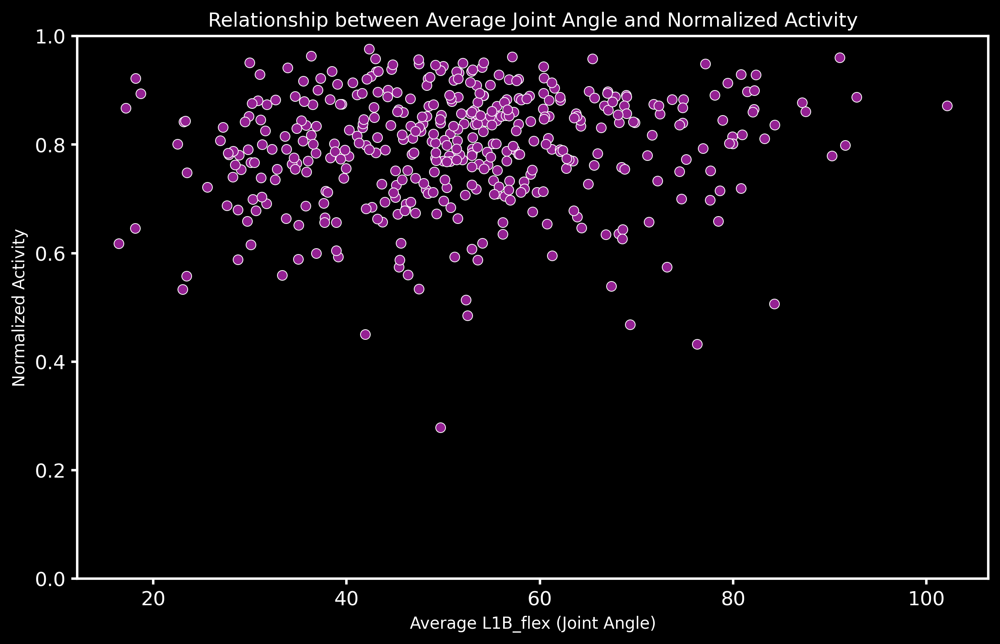

The variables are positively correlated.


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Assuming epochs_df is predefined and contains the relevant data
filtered_epochs_df = epochs_df[epochs_df['normalized_activity'] >= 0.4]

# Plotting the data
plt.style.use('dark_background') 
plt.figure(figsize=(10, 6), dpi = 300)
plt.ylim(0, 1)
ax = plt.gca()
ax.spines['top'].set_linewidth(1.5)
ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_linewidth(1.5)
ax.spines['right'].set_linewidth(1.5)
ax.xaxis.set_tick_params(width=1.5, labelsize=12)
ax.yaxis.set_tick_params(width=1.5, labelsize=12)
plt.legend(frameon=False, loc='lower right')
sns.scatterplot(
    x='average_L1B_flex', 
    y='normalized_activity', 
    data=epochs_df, 
    color='#942193')  # Set the color here

plt.title('Relationship between Average Joint Angle and Normalized Activity')
plt.xlabel('Average L1B_flex (Joint Angle)')
plt.ylabel('Normalized Activity')
plt.show()

# Linear regression analysis (code unchanged)
slope, intercept, r_value, p_value, std_err = stats.linregress(epochs_df['average_L1B_flex'], epochs_df['normalized_activity'])

# Check if the variables are positively correlated or not
if r_value > 0:
    print("The variables are positively correlated.")
else:
    print("The variables are not positively correlated.")


In [6]:
# To extract detailed information for each epoch, we'll iterate over the original DataFrame
# and collect the relevant data for the timeframes identified as epochs.

# Initialize an empty dictionary to store epoch details
epoch_details = {}

# Process each trial separately
for trial_name, trial_data in df.groupby('trial'):
    trial_data = trial_data.sort_values('time')
    min_activity = trial_data['activity'].min()
    max_activity = trial_data['activity'].max()
    trial_data['normalized_activity'] = (trial_data['activity'] - min_activity) / (max_activity - min_activity)

    # Initialize the start index for the first epoch
    start_idx = trial_data.index[0]

    # Iterate through time points within a trial to find epochs
    for current_idx in trial_data.index[1:]:
        # Calculate the total joint angle change from the start of the epoch
        total_angle_change = abs(trial_data.at[current_idx, 'L1C_flex'] - trial_data.at[start_idx, 'L1C_flex'])
        
        # Check if the total joint angle change is more than 5 degrees
        if total_angle_change >= angle_change_threshold:
            # Check if the duration of the epoch is more than 1 second
            if trial_data.at[current_idx, 'time'] - trial_data.at[start_idx, 'time'] > time_threshold:
                # If conditions are met, finalize the current epoch
                epoch_data = trial_data.loc[start_idx:current_idx]
                epoch_number += 1

                # Store the details of the epoch
                epoch_details[f'Epoch_{epoch_number}'] = {
                    'trial_name': trial_name,
                    'time_frames': epoch_data['time'].tolist(),
                    'joint_angles': epoch_data['L1C_flex'].tolist(),
                    'activities': epoch_data['activity'].tolist()
                }
            
            # Reset the start index for the next epoch
            start_idx = current_idx

# Display the details for the first epoch to verify the result
first_epoch_key = list(epoch_details.keys())[0]
epoch_details


{'Epoch_102': {'trial_name': '231208_A01_00001',
  'time_frames': [2.193456665167192,
   2.1967901859349235,
   2.2001237067026542,
   2.203457227470386,
   2.2067907482381166,
   2.2101242690058482,
   2.213457789773579,
   2.2167913105413106,
   2.2201248313090414,
   2.223458352076773,
   2.2267918728445046,
   2.2301253936122363,
   2.233458914379967,
   2.2367924351476987,
   2.2401259559154303,
   2.243459476683161,
   2.2467929974508927,
   2.2501265182186234,
   2.253460038986355,
   2.256793559754086,
   2.2601270805218174,
   2.263460601289548,
   2.2667941220572807,
   2.2701276428250114,
   2.273461163592743,
   2.276794684360474,
   2.2801282051282055,
   2.283461725895936,
   2.286795246663668,
   2.2901287674313986,
   2.2934622881991302,
   2.296795808966862,
   2.3001293297345926,
   2.3034628505023242,
   2.306796371270056,
   2.3101298920377875,
   2.3134634128055183,
   2.31679693357325,
   2.3201304543409806,
   2.3234639751087123,
   2.326797495876443,
   2.330131